# Presentation Plots

Random ERP-image examples from the manually labeled dataset:
- 3 random instances from 3 distinct pattern classes
- 1 random `no_class` instance
- original resolution, no downscale
- low-pass smoothing only
- 1% / 99% clipping via `ERPImageUtils`


In [2]:
versioninfo();

import Pkg;
ENV["JULIA_PKG_PRECOMPILE_AUTO"] = "0";
ENV["JULIA_NUM_PRECOMPILE_TASKS"] = "1";
Pkg.activate(".");

using Random, CSV, DataFrames, HDF5, Printf;
using CairoMakie;
using ImageFiltering: imfilter;

const RESULTS_CSV_PATHS = [
    joinpath(pwd(), "results", "project-14-at-2026-02-15-23-09-f5225e5c.csv"),
    joinpath(pwd(), "results", "project-15-at-2026-02-18-19-35-828515fe.csv"),
];
const FIXATIONS_DATA_DIR = joinpath(pwd(), "real_data_sets", "fixations_dataset");
const H5_PATH = joinpath(FIXATIONS_DATA_DIR, "data_fixations.hdf5");
const EVENTS_CSV_PATH = joinpath(FIXATIONS_DATA_DIR, "events.csv");
const SAMPLING_RATE = 512;
const PRE_STIM_S = 0.5;
const TIME_ZERO_IDX = Int(round(PRE_STIM_S * SAMPLING_RATE)) + 1;
const FILTER_BORDER = "reflect";
const LOWPASS_SIGMA = 75.0f0;
const LOWPASS_KERNEL_SIZE = (21, 21);

for p in vcat(RESULTS_CSV_PATHS, [H5_PATH, EVENTS_CSV_PATH])
    @assert isfile(p) "File not found: $p"
end

include(joinpath(pwd(), "..", "utils", "erp_image_utils.jl"));
using .ERPImageUtils: gaussian_kernel, zscore_timepoints;

function load_erps_from_h5(path::AbstractString)
    return h5open(path, "r") do f
        candidates = ["erps", "/erps", "data", "/data/data_fixations.hdf5", "data/data_fixations.hdf5"]
        for key in candidates
            if haskey(f, key)
                obj = f[key]
                if obj isa HDF5.Dataset
                    return read(obj)
                end
            end
        end

        function first_dataset(g)
            for k in keys(g)
                obj = g[k]
                if obj isa HDF5.Dataset
                    return read(obj)
                elseif obj isa HDF5.Group
                    x = first_dataset(obj)
                    x === nothing || return x
                end
            end
            return nothing
        end

        x = first_dataset(f)
        x === nothing && error("No dataset found in HDF5 file: $path")
        return x
    end
end

function load_and_merge_label_sources(paths::Vector{String})
    dfs = DataFrame[]
    for p in paths
        df = CSV.read(p, DataFrame)
        df.source_csv = fill(basename(p), nrow(df))
        push!(dfs, df)
    end

    labels_all = vcat(dfs...; cols = :union)

    if :image in names(labels_all)
        updated_at_str = :updated_at in names(labels_all) ? string.(coalesce.(labels_all.updated_at, "")) : fill("", nrow(labels_all))
        created_at_str = :created_at in names(labels_all) ? string.(coalesce.(labels_all.created_at, "")) : fill("", nrow(labels_all))
        labels_all.updated_at_str = updated_at_str
        labels_all.created_at_str = created_at_str
        sort!(labels_all, [:image, :updated_at_str, :created_at_str], rev = [false, true, true])
        return labels_all, unique(labels_all, :image)
    end

    return labels_all, labels_all
end

function sortvalues_from(df::DataFrame, col::Symbol)
    v = df[!, col]
    if eltype(v) <: Number
        return Float64.(v)
    end
    return collect(v)
end

function process_erp_original_resolution(erps, events::DataFrame, channel::Int, sort_col::Symbol, time_zero_idx::Int;
        low_pass_factor::Real = LOWPASS_SIGMA)
    @assert 1 <= channel <= size(erps, 1) "channel out of range"
    @assert sort_col in propertynames(events) "sort column not found: $(sort_col)"

    data = Float32.(erps[channel, time_zero_idx:end, :])
    n = min(size(data, 2), nrow(events))
    data = data[:, 1:n]
    events_n = events[1:n, :]

    sortvals = sortvalues_from(events_n, sort_col)
    order = sortperm(sortvals)
    data_sorted = data[:, order]
    data_z = zscore_timepoints(data_sorted)
    img_trials_time = Float32.(permutedims(data_z, (2, 1)))

    if low_pass_factor > 0
        kernel = gaussian_kernel(low_pass_factor, size(img_trials_time), size(img_trials_time), LOWPASS_KERNEL_SIZE)
        img_trials_time = Float32.(imfilter(img_trials_time, kernel, FILTER_BORDER))
    end

    return img_trials_time
end

const LS_ID_TO_SYMBOL = Dict(
    "0" => :no_class,
    "1" => :sigmoid,
    "2" => :one_sided_fan,
    "3" => :two_sided_fan,
    "4" => :diverging_bar,
    "5" => :hourglass,
    "6" => :tilted_bar,
);

const LS_NAME_TO_SYMBOL = Dict(
    "no class" => :no_class,
    "sigmoid" => :sigmoid,
    "one sided fan" => :one_sided_fan,
    "two sided fan" => :two_sided_fan,
    "diverging bar" => :diverging_bar,
    "hourglass" => :hourglass,
    "tilted bar" => :tilted_bar,
);

function parse_human_label(v)::Symbol
    s = lowercase(strip(string(v)))
    if haskey(LS_ID_TO_SYMBOL, s)
        return LS_ID_TO_SYMBOL[s]
    end
    s_norm = replace(replace(s, "_" => " "), "-" => " ")
    return get(LS_NAME_TO_SYMBOL, s_norm, Symbol(replace(s_norm, " " => "_")))
end

function parse_image_ref(image_ref::AbstractString)
    m = match(r"erp_(\d+)_ch(\d+)_([A-Za-z0-9_]+)\.png", image_ref)
    m === nothing && error("Could not parse image reference: $image_ref")
    return (
        task_id = parse(Int, m.captures[1]),
        channel = parse(Int, m.captures[2]),
        sort_var = Symbol(m.captures[3]),
    )
end

function resolve_label_row_metadata(row)
    cols = propertynames(row)
    if :channel in cols && :sort_variable in cols && !ismissing(row.channel) && !ismissing(row.sort_variable)
        task_id = (:id in cols && !ismissing(row.id)) ? Int(row.id) : -1
        return (
            task_id = task_id,
            channel = Int(row.channel),
            sort_var = Symbol(String(row.sort_variable)),
        )
    end
    return parse_image_ref(String(row.image))
end

erps = load_erps_from_h5(H5_PATH);
events = CSV.read(EVENTS_CSV_PATH, DataFrame);
labels_all_df, labels_merged_df = load_and_merge_label_sources(RESULTS_CSV_PATHS);

function build_plot_dataframe(labels_df::DataFrame)
    rows = NamedTuple[]
    skipped_rows = 0

    for row in eachrow(labels_df)
        try
            parsed = resolve_label_row_metadata(row)
            human_label = parse_human_label(row.erp_class)
            push!(rows, (
                task_id = parsed.task_id,
                channel = parsed.channel,
                sort_var = String(parsed.sort_var),
                image = String(row.image),
                human_label = String(human_label),
            ))
        catch err
            skipped_rows += 1
            @warn "Skipping label row in presentation_plots" exception = err image = getproperty(row, :image)
        end
    end

    return DataFrame(rows), skipped_rows
end

val_df, skipped_rows = build_plot_dataframe(labels_merged_df);
@assert nrow(val_df) > 0 "No valid labeled rows available for plotting.";

class_counts = combine(groupby(val_df, :human_label), nrow => :count);
sort!(class_counts, :count, rev = true);

println("ERP tensor size: ", size(erps), " (channel, time, trial)");
println("Events rows: ", nrow(events));
println("Labels imported (all): ", nrow(labels_all_df));
println("Labels merged unique by image: ", nrow(labels_merged_df));
println("Labels usable for plotting: ", nrow(val_df));
println("Skipped rows during metadata parsing: ", skipped_rows);
println("Class distribution:");
show(class_counts, allrows = true, allcols = true);
println();


Julia Version 1.12.3
Commit 966d0af0fdf (2025-12-15 11:20 UTC)
Build Info:
  Official https://julialang.org release
Platform Info:
  OS: Linux (x86_64-linux-gnu)
  CPU: 16 × AMD Ryzen 7 7800X3D 8-Core Processor
  WORD_SIZE: 64
  LLVM: libLLVM-18.1.7 (ORCJIT, znver4)
  GC: Built with stock GC
Threads: 16 default, 1 interactive, 16 GC (on 16 virtual cores)
Environment:
  JULIA_NUM_THREADS = 16


  Activating project at `~/Dokumente/BA2/notebooks/model_test`


ERP tensor size: (128, 769, 2508) (channel, time, trial)
Events rows: 2508
Labels imported (all): 500
Labels merged unique by image: 500
Labels usable for plotting: 500
Skipped rows during metadata parsing: 0
Class distribution:
6×2 DataFrame
 Row │ human_label    count 
     │ String         Int64 
─────┼──────────────────────
   1 │ no_class         452
   2 │ sigmoid           36
   3 │ diverging_bar      6
   4 │ hourglass          3
   5 │ two_sided_fan      2
   6 │ tilted_bar         1


Random plot seed: 13369219314523934669
Selected examples:
  hourglass        | ch57 | sac_amplitude | task=328
  sigmoid          | ch4 | duration | task=215
  two_sided_fan    | ch58 | sac_amplitude | task=162
  no_class         | ch67 | fix_avgpos_x | task=403
Saved figure to: /home/benjamin/Dokumente/BA2/notebooks/model_test/results/presentation_random_manual_label_examples.png


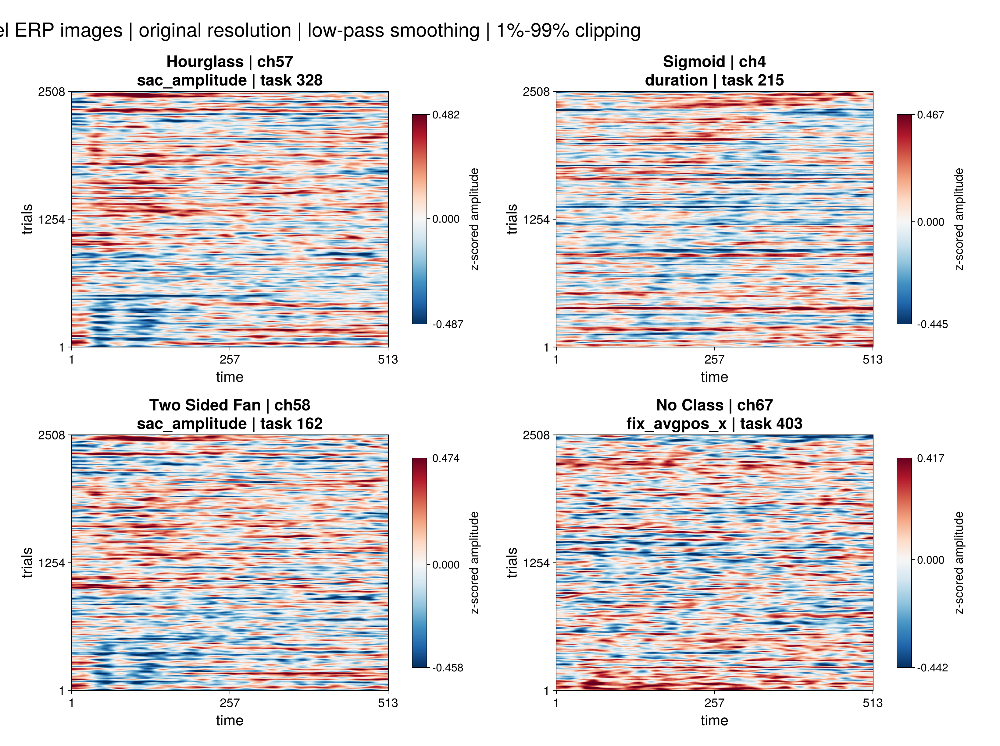

In [ ]:
notebooks/model_test/presentation_plots.ipynbnotebooks/model_test/presentation_plots.ipynbplot_class_display = Dict(
    :sigmoid => "Sigmoid",
    :one_sided_fan => "One Sided Fan",
    :two_sided_fan => "Two Sided Fan",
    :diverging_bar => "Diverging Bar",
    :hourglass => "Hourglass",
    :tilted_bar => "Tilted Bar",
    :no_class => "No Class",
);

function edge_mid_ticks(n::Int)
    vals = unique([1, Int(cld(n, 2)), n])
    return vals, string.(vals)
end

plot_seed = rand(UInt64);
plot_rng = MersenneTwister(plot_seed);

pattern_class_names = sort(unique(val_df.human_label[val_df.human_label .!= "no_class"]));
@assert length(pattern_class_names) >= 3 "Need at least 3 distinct pattern classes, found $(length(pattern_class_names)).";

selected_pattern_names = collect(shuffle(plot_rng, pattern_class_names)[1:3]);
selected_label_names = vcat(selected_pattern_names, ["no_class"]);

plot_examples = NamedTuple[];

for label_name in selected_label_names
    candidates = val_df[val_df.human_label .== label_name, :]
    @assert nrow(candidates) > 0 "No rows available for label $(label_name)"

    row = candidates[rand(plot_rng, 1:nrow(candidates)), :]
    img_trials_time = process_erp_original_resolution(
        erps,
        events,
        Int(row.channel),
        Symbol(row.sort_var),
        TIME_ZERO_IDX;
        low_pass_factor = LOWPASS_SIGMA,
    )

    clipped, crange, tick_vals, tick_labels, cmap = ERPImageUtils.clipped_color_stats_quantile_zero_ticks(
        img_trials_time;
        q_low = 0.01,
        q_high = 0.99,
    )

    push!(plot_examples, (
        label_name = label_name,
        label_display = plot_class_display[Symbol(label_name)],
        task_id = Int(row.task_id),
        channel = Int(row.channel),
        sort_var = String(row.sort_var),
        image_ref = String(row.image),
        img = clipped,
        colorrange = crange,
        tick_vals = tick_vals,
        tick_labels = tick_labels,
        colormap = cmap,
    ))
end

n_cols = 2;
n_rows = cld(length(plot_examples), n_cols);
panel_px = 520;
cb_px = 78;
row_px = 420;

fig = Figure(size = ((panel_px + cb_px + 48) * n_cols, row_px * n_rows + 96), figure_padding = 30);
Label(
    fig[0, :],
    "Random manual-label ERP images | original resolution | low-pass smoothing | 1%-99% clipping";
    tellwidth = false,
    fontsize = 32,
);

for (idx, example) in enumerate(plot_examples)
    row = cld(idx, n_cols)
    col = mod1(idx, n_cols)
    img_col = 2 * col - 1
    cb_col = 2 * col

    n_trials, n_time = size(example.img)

    ax = Axis(fig[row, img_col];
        title = "$(example.label_display) | ch$(example.channel)\n$(example.sort_var) | task $(example.task_id)",
        xlabel = "time",
        ylabel = "trials",
        titlesize = 26,
        xlabelsize = 24,
        ylabelsize = 24,
        xticklabelsize = 20,
        yticklabelsize = 20,
    )
    ax.xticks = edge_mid_ticks(n_time)
    ax.yticks = edge_mid_ticks(n_trials)

    hm = heatmap!(
        ax,
        1:n_time,
        1:n_trials,
        permutedims(example.img, (2, 1));
        colormap = example.colormap,
        colorrange = example.colorrange,
    )

    Colorbar(fig[row, cb_col], hm;
        width = 24,
        height = Relative(0.82),
        valign = :center,
        ticks = (example.tick_vals, example.tick_labels),
        ticklabelsize = 18,
        label = "z-scored amplitude",
        labelsize = 20,
    )

    rowsize!(fig.layout, row, Fixed(row_px))
    colsize!(fig.layout, img_col, Fixed(panel_px))
    colsize!(fig.layout, cb_col, Fixed(cb_px))
end

colgap!(fig.layout, 12);
rowgap!(fig.layout, 18);
resize_to_layout!(fig);

output_dir = joinpath(pwd(), "results");
mkpath(output_dir);
output_path = joinpath(output_dir, "presentation_random_manual_label_examples.png");
save(output_path, fig);

println("Random plot seed: ", plot_seed);
println("Selected examples:");
for example in plot_examples
    println("  ", rpad(example.label_name, 16), " | ch", example.channel, " | ", example.sort_var, " | task=", example.task_id)
end
println("Saved figure to: ", output_path);

fig
